<a href="https://colab.research.google.com/github/SayedUddinRayhan/Dog-Breed-Classification/blob/main/Dog_Breed_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## End-to-end Multil-class Dog Breed Classification

### Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Unzip the uploaded data into Google Drive
!unzip "/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/dog-breed-identification.zip" -d "/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Col

In [4]:
# Import TensorFlow into Colab
import tensorflow as tf

print("TF version:", tf.__version__)

TF version: 2.8.0


In [5]:
# Import necessary tools
import tensorflow_hub as hub 
print("TF version:", tf.__version__)
print("TF Hub version:", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 2.8.0
TF Hub version: 0.12.0
GPU available (YESSSS!!!!!)


## Getting our data ready (turning into Tensors)

In [6]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/labels.csv")
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
# How many images are there of each breed?
labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

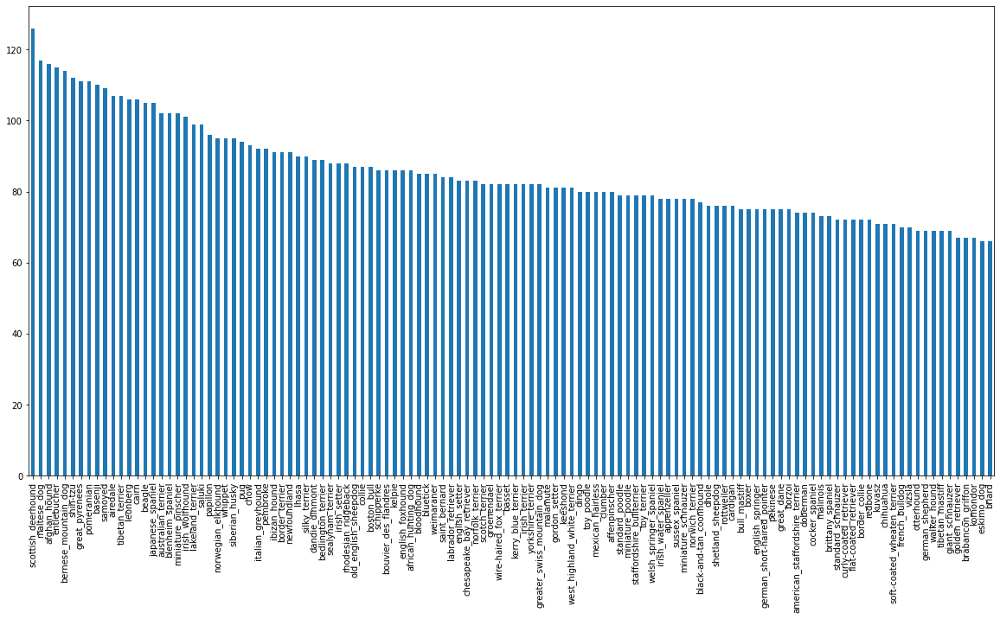

In [9]:
labels_csv.breed.value_counts().plot.bar(figsize=(20,10))

In [10]:
labels_csv.breed.value_counts().mean()

85.18333333333334

In [11]:
labels_csv.breed.value_counts().median()

82.0

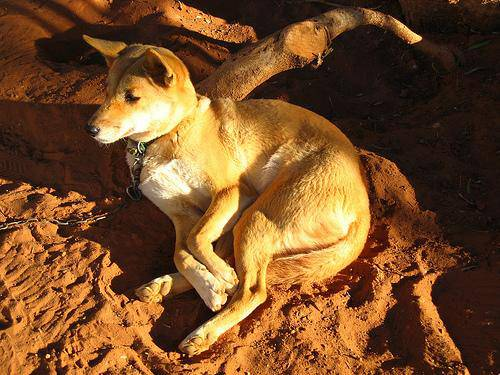

In [12]:
# Let's view an imag
from IPython.display import Image
Image("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

## Getting images and their labels

In [13]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [14]:
# Create pathnames from image ID's
filenames = ["/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset

In [15]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/")) == len(filenames):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do no match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


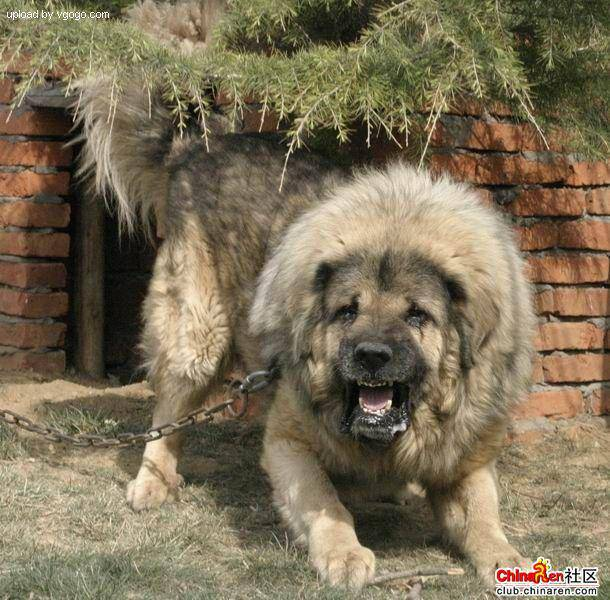

In [16]:
# One more check
Image(filenames[9000])

In [17]:
labels_csv.breed[9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels.

In [18]:
import numpy as np
labels = labels_csv["breed"].to_numpy() 
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [19]:
len(labels)

10222

In [20]:
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels doesn't matches number of filenames, please check data directory!")

Number of labels matches number of filenames!


In [21]:
# Find the unique labels
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [22]:
len(unique_breeds)

120

In [23]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [24]:
len(labels)

10222

In [25]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [26]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [27]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [28]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [29]:
filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset

## Creating our own validation set

In [30]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [31]:
len(filenames)

10222

Experimenting with ~1000 images and increase as needed.

In [32]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [33]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [34]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors)

In [35]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape
# height, width, color channel

(257, 350, 3)

In [36]:
image

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [37]:
image.max(), image.min()

(255, 0)

In [38]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [39]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [40]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

In [41]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [42]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [43]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [44]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [45]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [46]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")

In [47]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [48]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels
# show_25_images(train_images, train_labels)

(array([[[[0.5004552 , 0.5161415 , 0.5279062 ],
          [0.50920874, 0.524895  , 0.5366597 ],
          [0.5218838 , 0.53757006, 0.54933476],
          ...,
          [0.31011903, 0.28266805, 0.21207984],
          [0.30111128, 0.29505396, 0.23563515],
          [0.18941656, 0.19333813, 0.13059303]],
 
         [[0.5015542 , 0.51724046, 0.52900517],
          [0.5116366 , 0.5273229 , 0.5390876 ],
          [0.5218838 , 0.53757006, 0.54933476],
          ...,
          [0.31034905, 0.28289807, 0.21230984],
          [0.29528144, 0.28922412, 0.22980532],
          [0.18358673, 0.1875083 , 0.12476321]],
 
         [[0.50470275, 0.520389  , 0.5321537 ],
          [0.5138505 , 0.5295368 , 0.5413015 ],
          [0.52580535, 0.5414916 , 0.55325633],
          ...,
          [0.3140406 , 0.28658962, 0.2160014 ],
          [0.299842  , 0.29378468, 0.2343659 ],
          [0.1881473 , 0.19206887, 0.12932378]],
 
         ...,
 
         [[0.547514  , 0.5632003 , 0.6102591 ],
          [0.55959

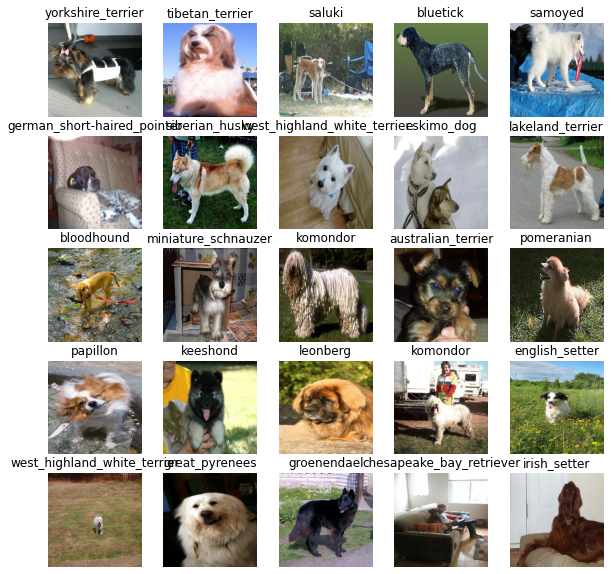

In [49]:
# Now let's visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

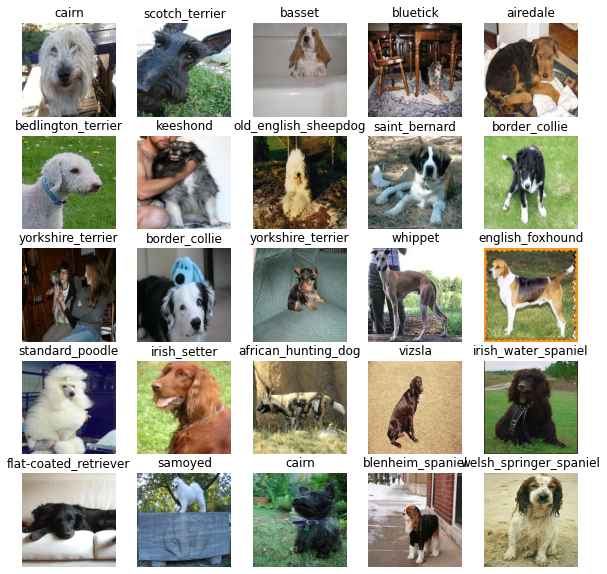

In [50]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

In [51]:
IMG_SIZE

224

In [52]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [53]:
INPUT_SHAPE

[None, 224, 224, 3]

In [54]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [55]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3,660,505
Trainable params: 120,240
Non-trainable params: 3,540,265
_________________________________________________________________


In [56]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [57]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/logs/",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

Early Stopping Callback

In [58]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

Training a model (on subset of data)

In [59]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [60]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSS!!!!!!)


In [61]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  # Return the fitted model
  return model

In [62]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4
Epoch 1/100
25/25 [==============================] - 29s 276ms/step - loss: 4.4543 - accuracy: 0.1088 - val_loss: 3.2815 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 5s 197ms/step - loss: 1.5069 - accuracy: 0.6938 - val_loss: 2.0098 - val_accuracy: 0.5150
Epoch 3/100
25/25 [==============================] - 5s 188ms/step - loss: 0.5117 - accuracy: 0.9438 - val_loss: 1.5601 - val_accuracy: 0.6450
Epoch 4/100
25/25 [==============================] - 5s 202ms/step - loss: 0.2304 - accuracy: 0.9900 - val_loss: 1.4223 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 5s 181ms/step - loss: 0.1302 - accuracy: 0.9975 - val_loss: 1.3528 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 5s 194ms/step - loss: 0.0904 - accuracy: 1.0000 - val_loss: 1.3232 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================] - 

Checking the TensorBoard logs

In [64]:
%tensorboard --logdir "/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/logs"

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [65]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [66]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 235ms/step


array([[7.6664553e-04, 4.7609344e-04, 1.5884977e-04, ..., 2.3492408e-04,
        6.3390318e-05, 2.8205130e-03],
       [1.3177520e-04, 4.1803117e-03, 7.4113341e-04, ..., 3.1368545e-04,
        1.8759351e-03, 2.2306032e-05],
       [1.7053846e-06, 1.9652609e-04, 6.3646490e-05, ..., 5.1992945e-05,
        6.3287572e-04, 1.1112329e-02],
       ...,
       [7.0423826e-05, 7.5340904e-05, 1.3755238e-05, ..., 4.4367803e-06,
        3.5781570e-04, 3.3705300e-04],
       [8.1172991e-05, 2.1099656e-06, 2.1565475e-05, ..., 1.1897145e-05,
        4.7674021e-05, 2.1333068e-04],
       [6.4008852e-04, 6.6328143e-06, 7.2933231e-05, ..., 2.0030132e-03,
        1.3083669e-03, 5.2049197e-04]], dtype=float32)

In [67]:
predictions[0]

array([7.66645535e-04, 4.76093439e-04, 1.58849769e-04, 2.20175920e-04,
       5.53277601e-03, 1.06168375e-03, 5.58761274e-03, 1.66318018e-03,
       9.59935132e-04, 2.41595466e-04, 1.01664824e-04, 1.13517127e-03,
       1.23955717e-04, 1.09460867e-04, 2.99588319e-05, 4.36200993e-04,
       2.41521280e-04, 2.72887107e-02, 1.67156410e-04, 3.56760836e-04,
       2.43210793e-03, 8.34202918e-04, 1.59195843e-04, 9.44868836e-04,
       3.47382083e-05, 1.10735316e-04, 1.64261729e-01, 5.08463243e-04,
       1.19647419e-03, 1.33654743e-03, 2.06068484e-03, 4.26542386e-03,
       7.31930413e-05, 7.83726500e-05, 3.10925097e-05, 1.65767204e-02,
       5.58933352e-05, 5.20029862e-04, 4.05359606e-05, 4.68726153e-04,
       1.33363035e-04, 1.29545195e-04, 3.79951998e-05, 3.78790451e-03,
       1.06308340e-04, 2.40517053e-04, 7.55742876e-05, 2.25915900e-03,
       9.63360886e-04, 2.87961302e-04, 6.75337506e-05, 1.91547733e-03,
       1.88186858e-03, 6.19274040e-04, 2.45949777e-05, 4.75750094e-05,
      

In [68]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[2.2167399e-06 1.7032716e-06 3.8577914e-06 4.9657261e-05 2.1117773e-04
 1.0102031e-05 1.6409011e-05 8.4355052e-05 8.5171388e-04 6.7398921e-03
 1.3239152e-05 3.4396007e-06 2.5801425e-04 4.9718271e-04 2.4844774e-05
 1.3023202e-03 1.2207189e-06 6.4238113e-05 4.1915384e-05 2.2322265e-06
 2.9020305e-06 3.3887653e-04 1.7119891e-06 2.5248480e-06 3.4259068e-04
 1.1253622e-06 7.4748112e-07 1.6220166e-06 4.3136538e-06 2.0160564e-06
 2.9851353e-06 1.9393652e-05 2.3270673e-05 4.7644908e-06 2.3827008e-06
 3.7780403e-06 2.4489678e-05 7.0869719e-05 1.0190509e-05 8.5242283e-01
 7.2595990e-06 5.1038779e-07 5.9390317e-05 8.6675645e-06 3.3383344e-06
 1.9579422e-06 3.9824677e-06 2.4918643e-05 2.0316204e-06 5.0008343e-06
 4.7566864e-06 1.8296106e-06 2.2915675e-04 2.6416570e-05 2.5150644e-06
 1.5892142e-04 2.7979799e-05 2.2032797e-05 5.8988044e-06 8.2850659e-07
 6.8395493e-06 4.7272035e-05 6.1336311e-07 1.3305597e-06 6.0567055e-07
 2.0758278e-06 9.9466843e-06 1.5843831e-05 2.9209559e-04 8.2591241e-06
 4.043

In [69]:
unique_breeds[113]

'walker_hound'

In [70]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'chesapeake_bay_retriever'

In [71]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [72]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and reutrns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [73]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

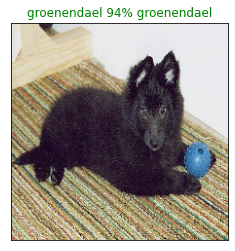

In [74]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [75]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

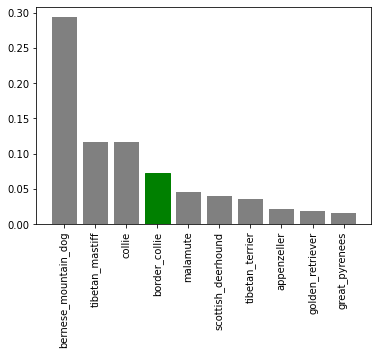

In [76]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

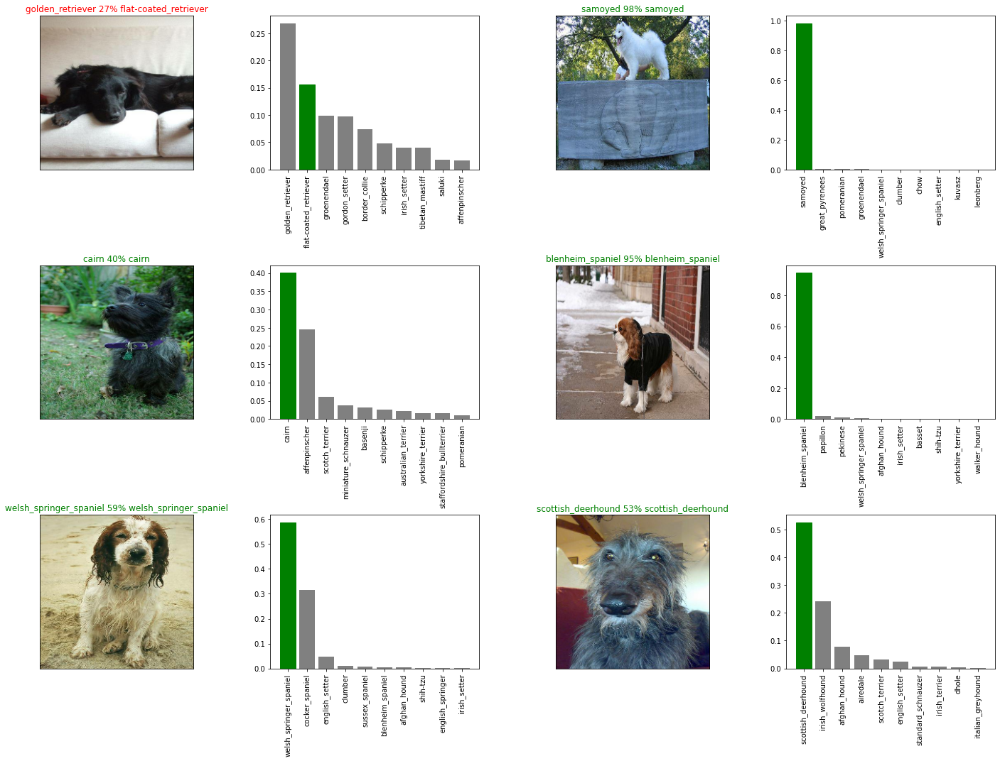

In [77]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [88]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [89]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [90]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-15571647187073-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-15571647187073-1000-images-mobilenetv2-Adam.h5'

In [92]:
# Evaluate the pre-saved model
model.evaluate(val_data)# Load a trained model
loaded_1000_image_model = load_model("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-15571647187073-1000-images-mobilenetv2-Adam.h5")

7/7 [==============================] - 2s 229ms/step - loss: 1.2114 - accuracy: 0.6900
Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-15571647187073-1000-images-mobilenetv2-Adam.h5


In [93]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 136ms/step - loss: 1.2114 - accuracy: 0.6900


[1.2114248275756836, 0.6899999976158142]

In [94]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 137ms/step - loss: 1.2114 - accuracy: 0.6900


[1.2114248275756836, 0.6899999976158142]

### Training a big dog model (on the full data)

In [95]:
len(X), len(y)

(10222, 10222)

In [96]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [97]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [98]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4


In [99]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [100]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 84s 235ms/step - loss: 1.2803 - accuracy: 0.6822
Epoch 2/100
320/320 [==============================] - 58s 181ms/step - loss: 0.3784 - accuracy: 0.8859
Epoch 3/100
320/320 [==============================] - 57s 179ms/step - loss: 0.2221 - accuracy: 0.9356
Epoch 4/100
320/320 [==============================] - 59s 183ms/step - loss: 0.1399 - accuracy: 0.9662
Epoch 5/100
320/320 [==============================] - 55s 173ms/step - loss: 0.0959 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 51s 158ms/step - loss: 0.0697 - accuracy: 0.9883
Epoch 7/100
320/320 [==============================] - 55s 173ms/step - loss: 0.0519 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 58s 180ms/step - loss: 0.0413 - accuracy: 0.9958
Epoch 9/100
320/320 [==============================] - 56s 176ms/step - loss: 0.0336 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 58s 182m

In [101]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-16201647188416-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-16201647188416-full-image-set-mobilenetv2-Adam.h5'

In [102]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-16201647188416-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/models/20220313-16201647188416-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

In [103]:
# Load test image filenames
test_path = "/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/000621fb3cbb32d8935728e48679680e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/00102ee9d8eb90812350685311fe5890.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Bre

In [104]:
len(test_filenames)

10357

In [105]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [106]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [107]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 95s 290ms/step


In [110]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/preds_array.csv", test_predictions, delimiter=",")

In [111]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/preds_array.csv", delimiter=",")

In [112]:
test_predictions.shape

(10357, 120)

## Making predictions on custom images

In [113]:
# Get custom image filepaths
custom_path = "/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/Dog-Photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [114]:
custom_image_paths

['/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/Dog-Photos/dog-photo-2.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/Dog-Photos/dog-photo-1.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/Dataset/Dog_Breed_Classification/Dog-Photos/dog-photo-3.jpeg']

In [115]:
# Turn custom images into batch datasets 
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [116]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [117]:
custom_preds.shape

(3, 120)

In [118]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['labrador_retriever', 'labrador_retriever', 'labrador_retriever']

In [119]:
# Get custom images 
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

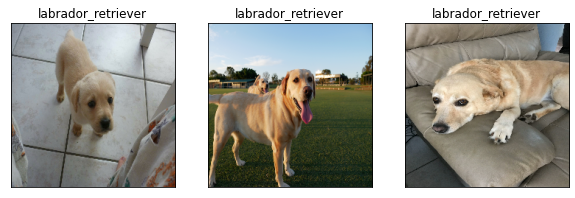

In [120]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)